<a href="https://colab.research.google.com/github/Sarach-git/CS-SBU-eDataMining-MSc-2022/blob/400422066/submits/400422066/project_2/Mobile_Price_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CS-SBU-eDataMining-MSc-2022  

Presented by Sara Charmchi  
Student ID : 400422066  

## Mobile Price Classification
The following dataset is a collection of sales data of mobile phones of various companies.The goal is to find realtionship between features of a mobile phone(eg:- RAM,Internal Memory etc) and its selling price(a price range indicating how high the price is)
Dataset: [Mobile Price Classification](https://www.kaggle.com/datasets/iabhishekofficial/mobile-price-classification?datasetId=11167&sortBy=commentCount)



#Importing Libraries

In [ ]:
from sklearn import preprocessing
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium import plugins
import branca.colormap as cm
import zipfile
from scipy import stats
import urllib
from geopy.distance import geodesic
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import precision_score as precision
from sklearn.metrics import recall_score as recall
from sklearn.metrics import f1_score as f1
import random
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
random.seed(42)


%matplotlib inline
from skimage.io import imread

# Loading Data

In [ ]:
!pip install kaggle

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle (1).json


{'kaggle.json': b'{"username":"saracharmchi","key":"cd5bd2a72d556a3aac50896f2bdf8efd"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d iabhishekofficial/mobile-price-classification

  0% 0.00/70.6k [00:00<?, ?B/s]
100% 70.6k/70.6k [00:00<00:00, 34.8MB/s]


In [ ]:
!ls

'kaggle (1).json'   kaggle.json   mobile-price-classification.zip   sample_data


In [ ]:
zip_ref = zipfile.ZipFile('mobile-price-classification.zip', 'r')
zip_ref.extractall('files')
zip_ref.close()

In [ ]:
!ls

 files		    kaggle.json			      sample_data
'kaggle (1).json'   mobile-price-classification.zip


In [ ]:
df=pd.read_csv('/content/files/train.csv')
df_mobile=df.copy()

In [ ]:
df_1=pd.read_csv('/content/files/test.csv')
df_test=df_1.copy()

In [ ]:
df_test.columns

Index(['id', 'battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc',
       'four_g', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc',
       'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi'],
      dtype='object')

In [ ]:
df_mobile.head(3)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2


In [ ]:
df_mobile.shape

(2000, 21)

In [ ]:
df_mobile.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [ ]:
df_mobile.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


#Data Cleaning

In [ ]:
df_mobile.isna().sum()/len(df_mobile)

battery_power    0.0
blue             0.0
clock_speed      0.0
dual_sim         0.0
fc               0.0
four_g           0.0
int_memory       0.0
m_dep            0.0
mobile_wt        0.0
n_cores          0.0
pc               0.0
px_height        0.0
px_width         0.0
ram              0.0
sc_h             0.0
sc_w             0.0
talk_time        0.0
three_g          0.0
touch_screen     0.0
wifi             0.0
price_range      0.0
dtype: float64

In [ ]:
df_mobile.duplicated().sum()

0

In [ ]:
df_mobile.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

#Data Visulization

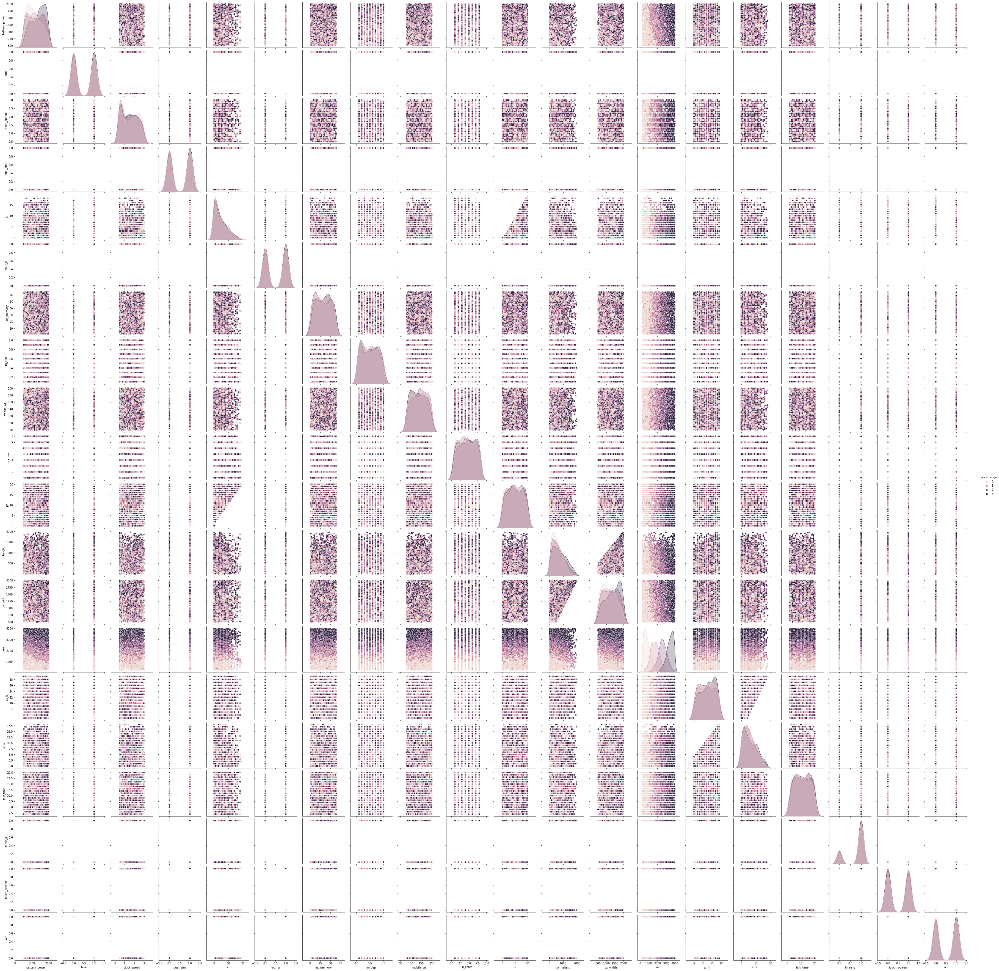

In [ ]:
#sns_plot = sns.pairplot(df_mobile,hue='price_range')
#sns_plot.savefig("pairplot_raw.png", format='png')
#sns_plot

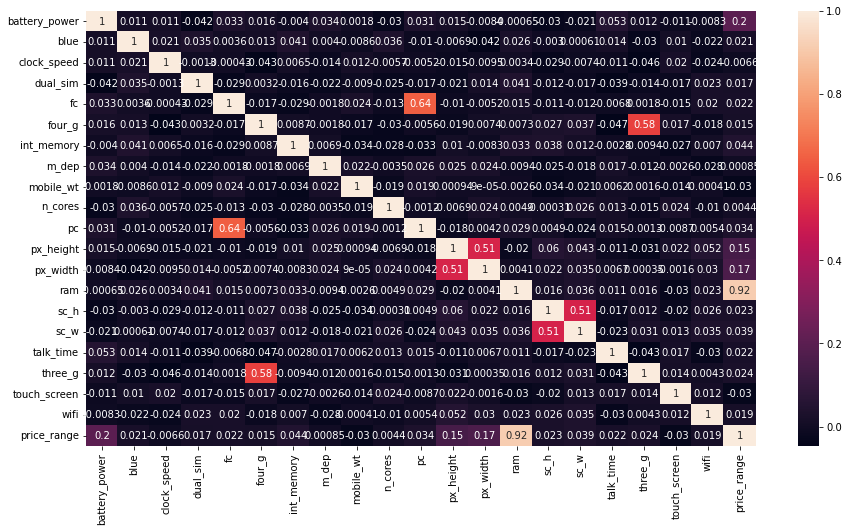

In [ ]:
corr = df_mobile.corr()
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot=True)

# Feature Selection

In [ ]:
X=df_mobile.drop('price_range',axis=1)


In [ ]:
X.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi'],
      dtype='object')

In [ ]:
Y=pd.DataFrame(df_mobile['price_range'])

change the 4 classifiaction of price range to a binary classification : cheap price range :0, expensive price range :1

In [ ]:
Y.loc[Y["price_range"] == 0, "price_range"] = 0
Y.loc[Y["price_range"] == 1, "price_range"] = 0
Y.loc[Y["price_range"] == 2, "price_range"] = 1
Y.loc[Y["price_range"] == 3, "price_range"] = 1


In [ ]:
Y.head()

,price_range
0,0
1,1
2,1
3,1
4,0


In [ ]:
Y.price_range.unique()

array([0, 1])

In [ ]:
y=Y['price_range']

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=101)

##ROC_AUC metrics

First of all lets take a look at roc_auc scores of all features :

In [ ]:
roc_auc=[]
for feature in X_train.columns:
  clf = LogisticRegression(solver="liblinear", random_state=0)
  clf.fit(X_train[feature].to_frame(),y_train )
  y_pred=clf.predict(X_test[feature].to_frame())
  roc_auc.append(roc_auc_score(y_test, y_pred))


In [ ]:
print(roc_auc)

[0.5676036866359446, 0.5, 0.5, 0.5, 0.48995391705069125, 0.5, 0.5029953917050691, 0.5, 0.5, 0.5, 0.48557603686635953, 0.5165437788018433, 0.5692165898617512, 0.9178801843317972, 0.5, 0.5349769585253457, 0.4879723502304148, 0.5, 0.5, 0.5]


In [ ]:
roc_values = pd.Series(roc_auc)
roc_values.index=X_train.columns
roc_values.sort_values(ascending=False, inplace=True)

In [ ]:
roc_values

ram              0.917880
px_width         0.569217
battery_power    0.567604
sc_w             0.534977
px_height        0.516544
int_memory       0.502995
blue             0.500000
touch_screen     0.500000
three_g          0.500000
sc_h             0.500000
wifi             0.500000
n_cores          0.500000
mobile_wt        0.500000
m_dep            0.500000
four_g           0.500000
dual_sim         0.500000
clock_speed      0.500000
fc               0.489954
talk_time        0.487972
pc               0.485576
dtype: float64

In [ ]:
import statsmodels.api as sm

def forward_selection(data, target, X_test, significance_level=0.50):
    initial_features = data.columns.tolist()
    best_features = []
    while (len(initial_features)>0):
        remaining_features = list(set(initial_features)-set(best_features))
        
        roc_auc=[]
        #data= data.reindex(columns=best_features)
        #X_test= X_test.reindex(columns=best_features)
        #data[best_features] = data[best_features].fillna(0).astype(np.int64, errors='ignore')
        #X_test[best_features] = X_test[best_features].fillna(0).astype(np.int64, errors='ignore')
        
            
            
            

        
        for new_column in remaining_features:
            
            clf = LogisticRegression(solver="liblinear", random_state=0)
            clf.fit(data[best_features+[new_column]], target)
            y_pred=clf.predict(X_test[best_features+[new_column]]) 
            
            roc_auc.append(roc_auc_score(y_test, y_pred))
            
            
            


        
        max_roc = roc_values.max()
        print(max_roc)
        if(max_roc>significance_level):
            best_features.append(roc_values.idxmax())
            
        else:
            break
    return best_features


#forward_selection(X_train,y_train, X_test)    

['ram', 'battery_power', 'px_height', 'px_width', 'n_cores', 'dual_sim']

In [ ]:
import statsmodels.api as sm
def forward_selection_pvalue(data, target, significance_level=0.05):
    initial_features = data.columns.tolist()
    best_features = []
    while (len(initial_features)>0):
        remaining_features = list(set(initial_features)-set(best_features))
        new_pval = pd.Series(index=remaining_features)
        for new_column in remaining_features:
            model = sm.OLS(target, sm.add_constant(data[best_features+[new_column]])).fit()
            new_pval[new_column] = model.pvalues[new_column]
        min_p_value = new_pval.min()
        if(min_p_value<significance_level):
            best_features.append(new_pval.idxmin())
        else:
            break
    return best_features

forward_selection_pvalue(X_train,y_train)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  import sys
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


['ram', 'battery_power', 'px_height', 'px_width', 'n_cores', 'dual_sim']

##Logistic regression

In [ ]:
sel=forward_selection_pvalue(X_train,y_train)
X_train_roc=X_train[[c for c in X_train.columns if c in sel]]
X_test_roc=X_test[[c for c in X_test.columns if c in sel]]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  import sys
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score
def logistic_regression(X_train,X_test,y_train,y_test):
  clf = LogisticRegression(solver="liblinear", random_state=0)
  clf.fit(X_train,y_train)
  y_pred=clf.predict(X_test)
  print('Precision: %.3f' % precision_score(y_test, y_pred))
  print('Recall: %.3f' % recall_score(y_test, y_pred))
  print('F1 Score: %.3f' % f1_score(y_test, y_pred))


In [ ]:
logistic_regression(X_train_roc,X_test_roc,y_train,y_test)

Precision: 0.968
Recall: 0.960
F1 Score: 0.964


## PCA

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
 
X_train_pca= sc.fit_transform(X_train)
X_test_pca= sc.transform(X_test)

pca = PCA(n_components = 6)
 
X_train_pca = pca.fit_transform(X_train_pca)
X_test_pca= pca.transform(X_test_pca)




explained_variance = pca.explained_variance_ratio_
explained_variance_sum=sum(explained_variance)*100
print(explained_variance,explained_variance_sum)


logistic_regression(X_train_pca,X_test_pca,y_train,y_test)


[0.08554278 0.08280647 0.08015747 0.07143874 0.05639682 0.05328582] 42.962809542625
Precision: 0.608
Recall: 0.500
F1 Score: 0.549


In [ ]:
pca_df = pd.DataFrame(data = X_train_pca
             , columns = ['principal component 1', 
                          'principal component 2',
                          'principal component 3',
                          'principal component 4',
                          'principal component 5',
                          'principal component 6'
                          ])
pca_df.head()

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6
0,-2.002493,-0.202791,-0.253118,0.181845,0.792483,1.331552
1,-1.192059,-0.322918,-1.134223,-0.258375,2.029070,0.921364
2,-1.790899,0.876709,1.427573,-0.600047,2.131622,0.916302
3,0.272805,-1.448530,0.556678,-0.705098,1.838050,-0.230234
4,-1.289530,0.457196,-0.272792,1.673519,-0.792381,-0.295009


In [ ]:
y_pca = df.loc[:,['price_range']].values

In [ ]:
finalDf = pd.concat([pca_df, df[['price_range']]], axis = 1)

In [ ]:
pca_df_test = pd.DataFrame(data = X_test_pca
             , columns = ['principal component 1', 
                          'principal component 2',
                          'principal component 3',
                          'principal component 4',
                          'principal component 5',
                          'principal component 6'
                          ])
pca_df_test.head()

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6
0,1.153002,-2.111396,-0.073373,-0.841354,-0.403100,-1.058707
1,-0.736454,1.282546,1.525201,-0.614102,-0.843117,0.564179
2,0.348325,-2.173929,-0.697167,1.030086,-1.056911,1.177745
3,0.744929,-1.095774,-0.024135,-1.827775,1.310739,0.240858
4,-1.523189,0.194005,1.360193,-1.076690,-2.210071,0.235121


In [ ]:
import plotly.express as px

labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

total_var = pca.explained_variance_ratio_.sum() * 100
fig = px.scatter_matrix(
    X_train_pca,
    labels=labels,
    dimensions=range(6),
    color=y_train,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(diagonal_visible=False)
fig.show()

#Feature Engineering

In [ ]:
X=df_mobile.drop('price_range' , axis=1)

In [ ]:
Y=pd.DataFrame(df_mobile['price_range'])

In [ ]:
Y.loc[Y["price_range"] == 0, "price_range"] = 0
Y.loc[Y["price_range"] == 1, "price_range"] = 0
Y.loc[Y["price_range"] == 2, "price_range"] = 1
Y.loc[Y["price_range"] == 3, "price_range"] = 1

In [ ]:
y=Y['price_range']

## binning

In [ ]:
#Creating bins and labels
bins = [150,1000,1650,2000]
labels = ['basic_mobile_phone','modified_basic_mobile_phone','smart_phones']

X['phone_types'] = pd.cut(X['battery_power'],bins = bins, labels = labels)

In [ ]:
df_bin = X.groupby(['battery_power','phone_types'])
df_bin.size().sort_values()

battery_power  phone_types                
1242           smart_phones                   0
1197           basic_mobile_phone             0
1195           smart_phones                   0
1723           basic_mobile_phone             0
1195           basic_mobile_phone             0
                                             ..
1063           modified_basic_mobile_phone    5
1413           modified_basic_mobile_phone    5
618            basic_mobile_phone             6
1589           modified_basic_mobile_phone    6
1872           smart_phones                   6
Length: 3282, dtype: int64

In [ ]:
df_bin.sum()

blue  clock_speed  dual_sim  fc  \
battery_power phone_types                                                    
501           basic_mobile_phone              1          2.8         1  26   
              modified_basic_mobile_phone     0          0.0         0   0   
              smart_phones                    0          0.0         0   0   
502           basic_mobile_phone              0          2.3         1  14   
              modified_basic_mobile_phone     0          0.0         0   0   
...                                         ...          ...       ...  ..   
1997          modified_basic_mobile_phone     0          0.0         0   0   
              smart_phones                    1          1.8         1   1   
1998          basic_mobile_phone              0          0.0         0   0   
              modified_basic_mobile_phone     0          0.0         0   0   
              smart_phones                    1          1.2         0   8   

                                           four_g  int_memory  m_dep  \
battery_power phone_types                                              
501           basic_mobile_phone                1          76    0.8   
              modified_basic_mobile_phone       0           0    0.0   
              smart_phones                      0           0    0.0   
502           basic_mobile_phone                0          89    1.2   
              modified_basic_mobile_phone       0           0    0.0   
...                                           ...         ...    ...   
1997          modified_basic_mobile_phone       0           0    0.0   
              smart_phones                      0          40    0.5   
1998          basic_mobile_phone                0           0    0.0   
              modified_basic_mobile_phone       0           0    0.0   
              smart_phones                      0          31    0.6   

                                           mobile_wt  n_cores  pc  px_height  \
battery_power phone_types                                                      
501           basic_mobile_phone                 305       10  39        743   
              modified_basic_mobile_phone          0        0   0          0   
              smart_phones                         0        0   0          0   
502           basic_mobile_phone                 281        8  20        986   
              modified_basic_mobile_phone          0        0   0          0   
...                                              ...      ...  ..        ...   
1997          modified_basic_mobile_phone          0        0   0          0   
              smart_phones                       185        4   8        866   
1998          basic_mobile_phone                   0        0   0          0   
              modified_basic_mobile_phone          0        0   0          0   
              smart_phones                       196        8  19         50   

                                           px_width   ram  sc_h  sc_w  \
battery_power phone_types                                               
501           basic_mobile_phone               2725  5423    30    15   
              modified_basic_mobile_phone         0     0     0     0   
              smart_phones                        0     0     0     0   
502           basic_mobile_phone               2969  4315    11     5   
              modified_basic_mobile_phone         0     0     0     0   
...                                             ...   ...   ...   ...   
1997          modified_basic_mobile_phone         0     0     0     0   
              smart_phones                     1212  1655     7     6   
1998          basic_mobile_phone                  0     0     0     0   
              modified_basic_mobile_phone         0     0     0     0   
              smart_phones                     1356  2311    17     9   

                                           talk_time  three_g  touch_screen  \
battery_power phone_t

In [ ]:
df_mobile['phone_types'].unique()

['basic_mobile_phone', 'modified_basic_mobile_phone', 'smart_phones']
Categories (3, object): ['basic_mobile_phone' < 'modified_basic_mobile_phone' < 'smart_phones']

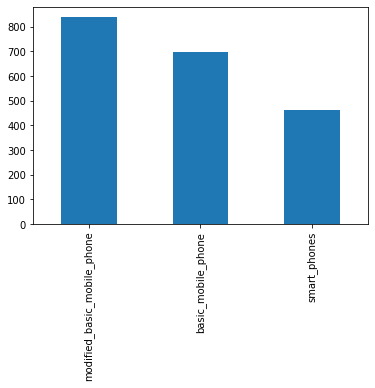

In [ ]:
df_mobile['phone_types'].value_counts().plot(kind='bar')

In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
X.apply(LabelEncoder().fit_transform)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=101)

In [ ]:
logistic_regression(X_train,X_test,y_train,y_test)

##One_hot_encoding

In [ ]:
from sklearn.preprocessing import OneHotEncoder

In [ ]:
enc = OneHotEncoder(handle_unknown='ignore')

enc_df = pd.DataFrame(enc.fit_transform(X[['phone_types']]).toarray())

X = df_mobile.join(enc_df)
X.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,sc_w,talk_time,three_g,touch_screen,wifi,price_range,phone_types,0,1,2
0,842,0,2.2,0,1,0,7,0.6,188,2,...,7,19,0,0,1,1,basic_mobile_phone,1.0,0.0,0.0
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,3,7,1,1,0,2,modified_basic_mobile_phone,0.0,1.0,0.0
2,563,1,0.5,1,2,1,41,0.9,145,5,...,2,9,1,1,0,2,basic_mobile_phone,1.0,0.0,0.0
3,615,1,2.5,0,0,0,10,0.8,131,6,...,8,11,1,0,0,2,basic_mobile_phone,1.0,0.0,0.0
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,2,15,1,1,0,1,smart_phones,0.0,0.0,1.0


In [ ]:
X=X.drop('phone_types',axis=1)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=101)

In [ ]:
logistic_regression(X_train,X_test,y_train,y_test)

##Log_transform

In [ ]:
X.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range,0,1,2
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000,0.348500,0.420000,0.231500
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314,0.476614,0.493682,0.421897
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000,0.000000,0.000000,0.000000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000,0.000000,0.000000,0.000000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000,1.000000,1.000000,0.000000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000,1.000000,1.000000,1.000000


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


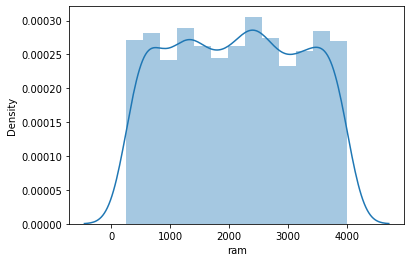

In [ ]:
sns.distplot(X['ram'])

In [ ]:
X['log_ram'] = np.log(X['ram'])

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


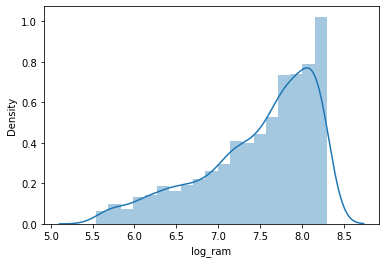

In [ ]:
sns.distplot(X['log_ram'])

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=101)

In [ ]:
logistic_regression(X_train,X_test,y_train,y_test)

## Make a new feature

In [ ]:
X['px_total'] = X['px_height'] * X['px_width']
X['volume'] = X['sc_w']*X['sc_h'] * X['m_dep']

df_test['px_total'] = df_test['px_height'] * df_test['px_width']
df_test['volume'] = df_test['sc_w']*df_test['sc_h'] * df_test['m_dep']

X.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,three_g,touch_screen,wifi,price_range,0,1,2,log_ram,px_total,volume
0,842,0,2.2,0,1,0,7,0.6,188,2,...,0,0,1,1,1.0,0.0,0.0,7.843456,15120,37.8
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,1,1,0,2,0.0,1.0,0.0,7.875119,1799140,35.7
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1,1,0,2,1.0,0.0,0.0,7.864420,2167308,19.8
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1,0,0,2,1.0,0.0,0.0,7.926242,2171776,102.4
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1,1,0,1,0.0,0.0,1.0,7.252054,1464096,9.6


In [ ]:
X_log=X.drop('log_ram' , axis=1)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_log, y, test_size=0.33, random_state=101)

In [ ]:
logistic_regression(X_train,X_test,y_train,y_test)

##Logistic Regression

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=101)

In [ ]:
logistic_regression(X_train,X_test,y_train,y_test)

#Decision Tree

## Build Decision Tree

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_mobile.iloc[:,:20], df_mobile['price_range'], test_size=0.3, random_state=0)

dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)
#y_pred = dtc.predict(X_test)


[Text(0.5446698588709677, 0.9642857142857143, 'X[13] <= 0.124\ngini = 0.75\nsamples = 1400\nvalue = [349, 365, 349, 337]'),
 Text(0.2599546370967742, 0.8928571428571429, 'X[13] <= -0.863\ngini = 0.583\nsamples = 745\nvalue = [349, 323, 73, 0]'),
 Text(0.16036626344086022, 0.8214285714285714, 'X[11] <= 1.775\ngini = 0.239\nsamples = 339\nvalue = [292, 47, 0, 0]'),
 Text(0.12718413978494625, 0.75, 'X[0] <= 1.316\ngini = 0.181\nsamples = 319\nvalue = [287, 32, 0, 0]'),
 Text(0.09576612903225806, 0.6785714285714286, 'X[13] <= -0.978\ngini = 0.112\nsamples = 285\nvalue = [268, 17, 0, 0]'),
 Text(0.07325268817204302, 0.6071428571428571, 'X[6] <= 1.725\ngini = 0.054\nsamples = 251\nvalue = [244, 7, 0, 0]'),
 Text(0.05510752688172043, 0.5357142857142857, 'X[16] <= 1.552\ngini = 0.04\nsamples = 248\nvalue = [243, 5, 0, 0]'),
 Text(0.03494623655913978, 0.4642857142857143, 'X[12] <= 1.652\ngini = 0.025\nsamples = 234\nvalue = [231, 3, 0, 0]'),
 Text(0.021505376344086023, 0.39285714285714285, 'X[1

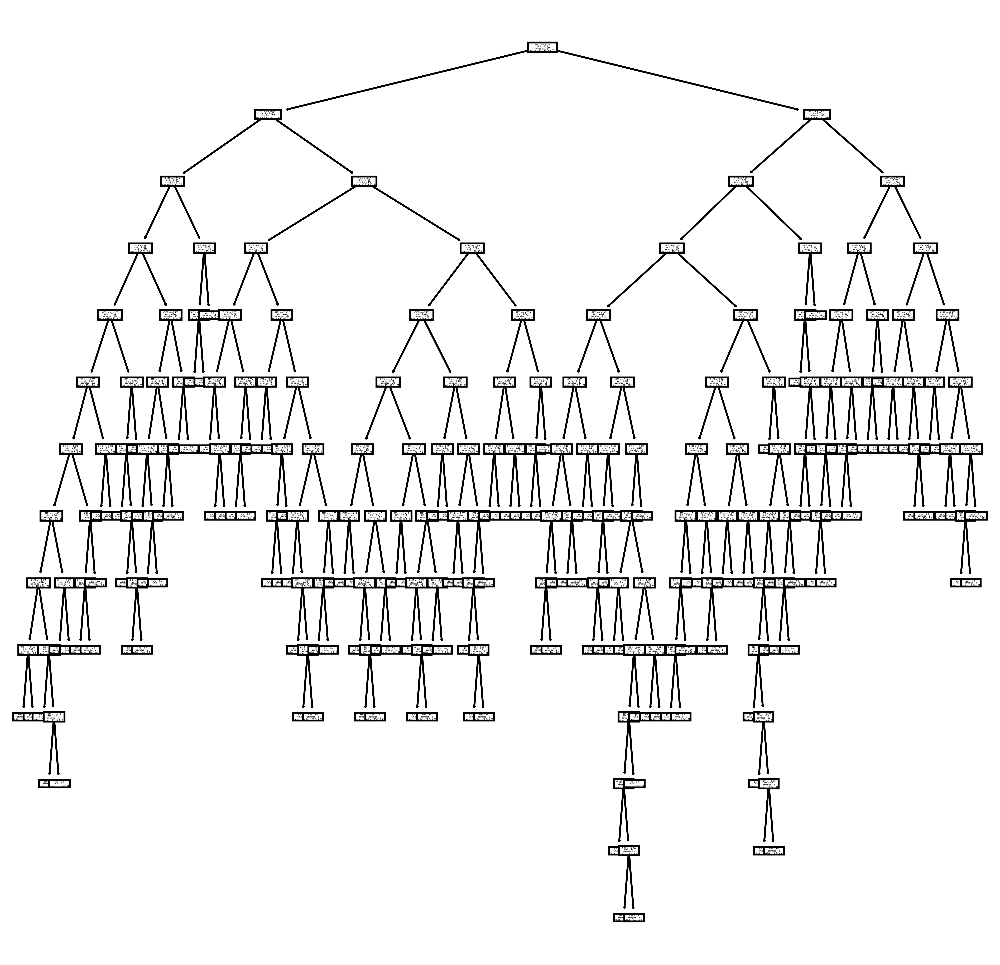

In [ ]:
from sklearn import tree
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (9,9), dpi=800)
tree.plot_tree(dtc)

In [ ]:
print("Accuracy on train:",metrics.accuracy_score(y_train, dtc.predict(X_train)))
print("Accuracy on test:",metrics.accuracy_score(y_test, dtc.predict(X_test)))


Accuracy on train: 1.0
Accuracy on test: 0.8316666666666667


In [ ]:
print('Precision on train:', precision(y_train, dtc.predict(X_train), average='micro'))
print('Precision on test:', precision(y_test, dtc.predict(X_test), average='micro'))

Precision on train: 1.0
Precision on test: 0.8316666666666667


In [ ]:
print('Recall on train:', recall(y_train, dtc.predict(X_train), average='micro'))
print('Recall on test:', recall(y_test, dtc.predict(X_test), average='micro'))

Recall on train: 1.0
Recall on test: 0.8316666666666667


In [ ]:
print('F1-score on train:', f1(y_train, dtc.predict(X_train), average='micro'))
print('F1-score on test:', f1(y_test, dtc.predict(X_test), average='micro'))

F1-score on train: 1.0
F1-score on test: 0.8316666666666667


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_mobile.iloc[:,:20], df_mobile['price_range'], test_size=0.3, random_state=0)


In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)

DecisionTreeClassifier()

In [ ]:
print('Precision on train:', precision(y_train, dtc.predict(X_train), average='micro'))
print('Precision on test:', precision(y_test, dtc.predict(X_test), average='micro'))

Precision on train: 1.0
Precision on test: 0.8383333333333334


In [ ]:
print('Recall on train:', recall(y_train, dtc.predict(X_train), average='micro'))
print('Recall on test:', recall(y_test, dtc.predict(X_test), average='micro'))

Recall on train: 1.0
Recall on test: 0.8383333333333334


In [ ]:
print('F1-score on train:', f1(y_train, dtc.predict(X_train), average='micro'))
print('F1-score on test:', f1(y_test, dtc.predict(X_test), average='micro'))

F1-score on train: 1.0
F1-score on test: 0.8383333333333334


## Performance of a Decision Tree

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_mobile.iloc[:,:20], df_mobile['price_range'], test_size=0.3, random_state=0)


In [ ]:
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)

DecisionTreeClassifier()

**Hyperparameter tuning**

In [ ]:
params_dist = {
	'criterion': ['gini', 'entropy'],
	'max_depth': [4, 6, 8, 10, 12, 14, 16],
	'max_leaf_nodes': [1000, 2000, 3000],
	'min_samples_leaf': [20, 30, 40, 50],
	'min_samples_split': [30, 40, 50]
}

In [ ]:
dtc = DecisionTreeClassifier()
random_search = RandomizedSearchCV(dtc, params_dist, cv=5)
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [4, 6, 8, 10, 12, 14, 16],
                                        'max_leaf_nodes': [1000, 2000, 3000],
                                        'min_samples_leaf': [20, 30, 40, 50],
                                        'min_samples_split': [30, 40, 50]})

In [ ]:
from sklearn._config import get_config, set_config
get_config()["print_changed_only"]

True

In [ ]:
set_config(print_changed_only=False)

In [ ]:
random_search

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    random_state=None,
                                                    splitter='best'),
                   n_iter=10, n_jobs=None,
                   param_distributions={'criteri

In [ ]:
tuned_dtc = random_search.best_estimator_

In [ ]:
print('Precision on train:', precision(y_train, tuned_dtc.predict(X_train), average='micro'))
print('Precision on test:', precision(y_test, tuned_dtc.predict(X_test), average='micro'))

Precision on train: 0.895
Precision on test: 0.815


[Text(0.4857456140350877, 0.9375, 'X[13] <= 2235.5\nentropy = 1.999\nsamples = 1400\nvalue = [349, 365, 349, 337]'),
 Text(0.18421052631578946, 0.8125, 'X[13] <= 1175.5\nentropy = 1.364\nsamples = 745\nvalue = [349, 323, 73, 0]'),
 Text(0.07017543859649122, 0.6875, 'X[0] <= 1252.5\nentropy = 0.581\nsamples = 339\nvalue = [292, 47, 0, 0]'),
 Text(0.03508771929824561, 0.5625, 'X[11] <= 1199.5\nentropy = 0.121\nsamples = 183\nvalue = [180, 3, 0, 0]'),
 Text(0.017543859649122806, 0.4375, 'entropy = 0.0\nsamples = 163\nvalue = [163, 0, 0, 0]'),
 Text(0.05263157894736842, 0.4375, 'entropy = 0.61\nsamples = 20\nvalue = [17, 3, 0, 0]'),
 Text(0.10526315789473684, 0.5625, 'X[12] <= 1713.5\nentropy = 0.858\nsamples = 156\nvalue = [112, 44, 0, 0]'),
 Text(0.08771929824561403, 0.4375, 'X[13] <= 837.0\nentropy = 0.615\nsamples = 125\nvalue = [106, 19, 0, 0]'),
 Text(0.05263157894736842, 0.3125, 'X[0] <= 1812.0\nentropy = 0.161\nsamples = 85\nvalue = [83, 2, 0, 0]'),
 Text(0.03508771929824561, 0.187

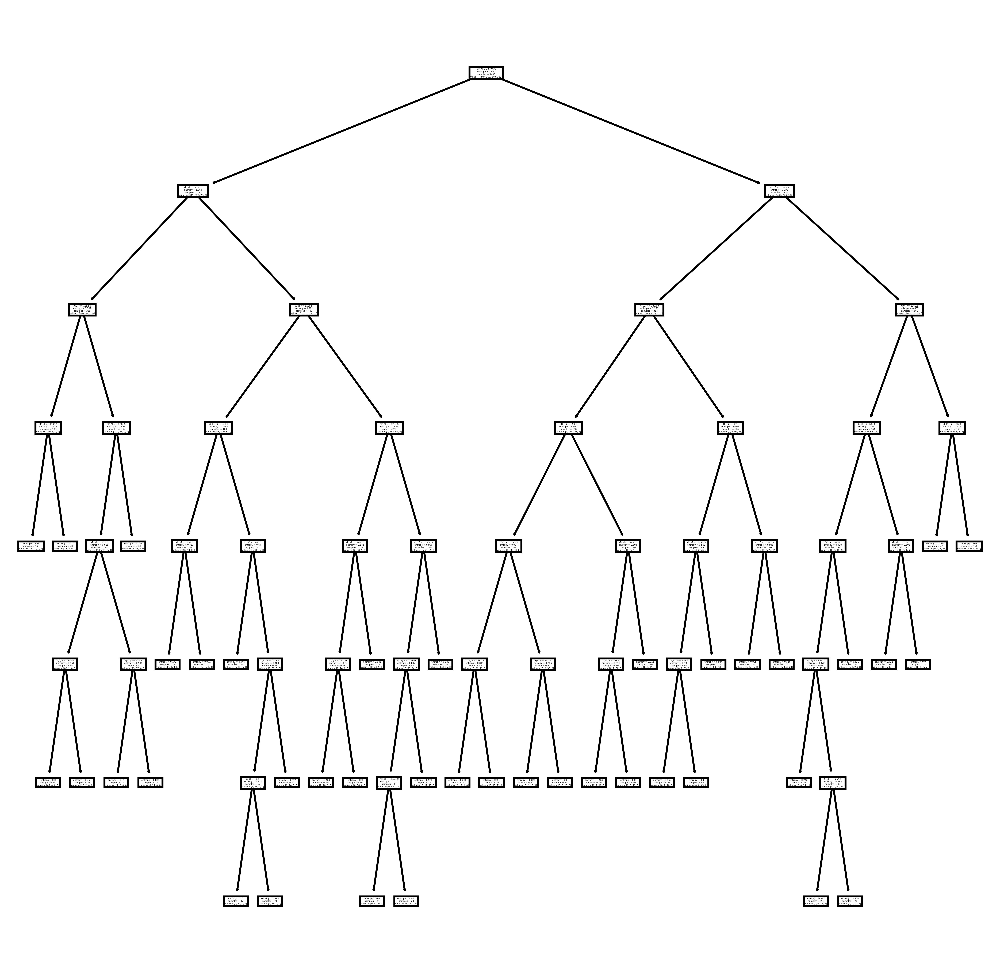

In [ ]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (9,9), dpi=800)
tree.plot_tree(tuned_dtc)